# Introduction à l'apprentissage par renforcement
# TP 1 - les manchots multi-bras

1/4 de la note finale est liée à la mise en forme : 

* pensez à nettoyer les outputs inutiles (installation, messages de débuggage, ...)
* soignez vos figures : les axes sont-ils faciles à comprendre ? L'échelle est adaptée ? 
* commentez vos résultats : vous attendiez-vous à les avoir ? Est-ce étonnant ? Faites le lien avec la théorie.

Ce TP reprend l'exemple d'un médecin et de ses vaccins. Vous allez comparer plusieurs stratégies et trouver celle optimale.
Un TP se fait seul ou en binôme. Aucun groupe de plus de 2 personnes. 

Vous allez rendre le TP depuis un lien GitHub avec ce notebook mais une version du rapport exportée en PDF & HTML. 

In [ ]:
! pip install matplotlib tqdm numpy ipympl opencv-python torch seaborn
!jupyter labextension install @jupyter-widgets/jupyterlab-manager
!jupyter labextension install jupyter-matplotlib

In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline 

import typing as t
import math
import torch
import numpy as np
from tqdm.auto import trange, tqdm
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import cv2
from IPython.display import display, clear_output, HTML
import seaborn as sns

torch.random.manual_seed(0)

K = 5 # num arms

# Présentation du problème

In [7]:
class ArmBernoulli:
    def __init__(self, p: float):
        """
        Vaccine treatment following a Bernoulli law (mean is p and variance is p(1-p)
        Args:
             p (float): mean parameter
             
        >>> torch.random.manual_seed(random_state)        
        >>> arm = ArmBernoulli(0.5)
        >>> arm.sample(5)
        tensor([ True, False,  True,  True,  True])
        """
        self.immunity_rate = p

    def sample(self, n: int = 1):
        return torch.rand(n) < self.immunity_rate
    
    def __repr__(self):
        return f'<ArmBernoulli p={self.immunity_rate}' 

def generate_arms(num_arms: int):
    means = torch.rand(num_arms)
    MAB = [ArmBernoulli(m) for m in means]
    assert MAB[0].immunity_rate == means[0]
    assert (MAB[0].sample(10) <= 1).all() and (MAB[0].sample(10) >= 0).all() 
    return MAB

MAB = generate_arms(K)

Ce TP reprend l'exemple du médecin présenté en cours.


**Q1. Créez une fonction pour trouver $\mu^*$ à partir d'un `MAB`. Comment est définie la récompense $R_k$ ? Que représente concrètement le regret dans le contexte de ce TP ?**

In [8]:
def best_vaccine_in_mab(mab):
    # return the index of the best vaccine in the MAB
    return np.array([vaccine.immunity_rate for vaccine in mab]).argmax()

print(f"Best vaccine in MAB: {best_vaccine_in_mab(MAB)},  with immunity rate {MAB[best_vaccine_in_mab(MAB)].immunity_rate.item():.2f}")
for i, arm in enumerate(MAB):
        print(f"Vaccine {i} has immunity rate {arm.immunity_rate.item():.2f}")

Best vaccine in MAB: 1,  with immunity rate 0.77
Vaccine 0 has immunity rate 0.50
Vaccine 1 has immunity rate 0.77
Vaccine 2 has immunity rate 0.09
Vaccine 3 has immunity rate 0.13
Vaccine 4 has immunity rate 0.31


La récompense $R_k$ est définie selon la loi de Bernoulli, donc 1 (p) si c'est une réussite et 0 (1-p) si échec.

Le regret représente la différence entre le fonctionnement théorique du vaccin (phase de d'exploration) et l'exploitation réelle de la chance d'immunisation.

**Note importante :** pour la suite, les résultats seront généralement réalisés avec 100 initialisations différentes du MAB (tous les MAB ont 5 vaccins mais des taux d'immunistation différent) pour réduire le bruit de simulation. Concrètement, on exécutera au moins 100x `generate_arms`.

# I. Cas classique des bandits manchots 

## I.a. Solution Gloutonne

Le médecin fonctionne sur deux phases :

1. **Exploration :** Le médecin calcule le taux d'immunisation empirique sur les N premiers patients en administrant le même nombre de fois chaque vaccin :

$$\hat{\mu_i}[0\rightarrow N] = \frac{1}{T_i} \sum_{k=0}^{N-1} \chi_{v_k,i}R_k,$$

avec $T_i = \sum_{k=0}^{N-1} \chi_{v_k,i}$.


2. **Exploitation :** Le vaccin $v_i = \arg\max_j \hat{\mu_j}[0\rightarrow N]$ est utilisé pour les M patients suivants.

**Q2. Implémentez cette solution avec N = 50 et M = 500 et testez-la avec 100 MAB. On souhaite savoir si vous trouvez le vaccin optimal à l'issue d'une phase d'exploration. Quelle est l'espérance empirique de cette variable ? Et son écart-type ? Calculez de même l'espérance et l'écart-type du regret sur vos 100 simulations.**

Pour rappel, le regret est défini par :

$$r_n = n\mu^* - \sum_{k=0}^{n-1} R_k$$

**Attention :** $n$ est le nombre total de patients, donc ici $N + M$.

In [9]:
Mab_list = [generate_arms(5) for _ in range(100)]
N = 50
M = 500

In [10]:
def exploration(n, mab):
    R = np.zeros(K)
    for i, arm in enumerate(mab):
        R[i] = arm.sample(n // K).sum()
    return R

def getBestVaccin(R, hist):
    Ri = np.array([np.inf] * K) # Important pour n = 0
    for i in range(K):
        if hist[i] != 0:
            Ri[i] = R[i] / hist[i]
    return Ri.argmax()

def exploitationQ2(n,m, mab_list):
    rates = []
    regrets = []
    for mab in mab_list:
        # Phase d'exploration
        R = exploration(n, mab)
        # exploitation
        hist = [n // K] * K
        bestVac= getBestVaccin(R, hist)
        Mab_res = mab[bestVac].sample(m).sum()
        R[bestVac] += Mab_res
        hist[bestVac] += m
        ### exploration success rate
        list_immunity_rates = [i.immunity_rate for i in mab]
        best_vac_from_immunity_rates = best_vaccine_in_mab(mab)
        success = (bestVac == best_vac_from_immunity_rates)
        ### regret
        regret = (n + m) * max(list_immunity_rates) - R.sum()

        regrets.append(regret)
        rates.append(success)

    return regrets, rates

regrets, rates = exploitationQ2(N, M, Mab_list)

mean_rates = np.mean(rates)
std_rates = np.std(rates)
mean_regret = np.mean(regrets)
std_regret = np.std(regrets)

print(f"Espérance empirique: {mean_rates}")
print(f"Écart-type : {std_rates}")
print(f"Espérance du regret: {mean_regret}")
print(f"Écart-type du regret: {std_regret}")

Espérance empirique: 0.68
Écart-type : 0.46647615158762396
Espérance du regret: 30.894350051879883
Écart-type du regret: 31.458023071289062


On remarque que l'algorithme glouton ne trouve pas tout le temps le bon vaccin, cependant l'espérance du regret reste aux alentours de 30. On peut en conclure que l'algorithme glouton ne trouve pas forcément le meilleur vaccin, mais il en trouvera un qui marche bien ou qui est proche du taux d'immunité du meilleur vaccin. Cette théorie peut être soutenue par un écart-type relativement petit; il serait bien plus grand si l'algorithme ne trouvait pas un vaccin presque aussi efficace que le meilleur vaccin.

**Q3. On étudie maintenant l'influence de la taille du training set $N$. On considère que N+M est une constante, puis on fait varier N entre K et M. Calculez le regret pour ces différentes tailles du training set  différents MAB et representez le regret moyen, le regret min et max (vous devriez trouver une courbe en U ou en V pour le regret moyen). Quelle est la taille optimale du training set ?**

min: 25.13, k: 40
max: 189.38, k: 540


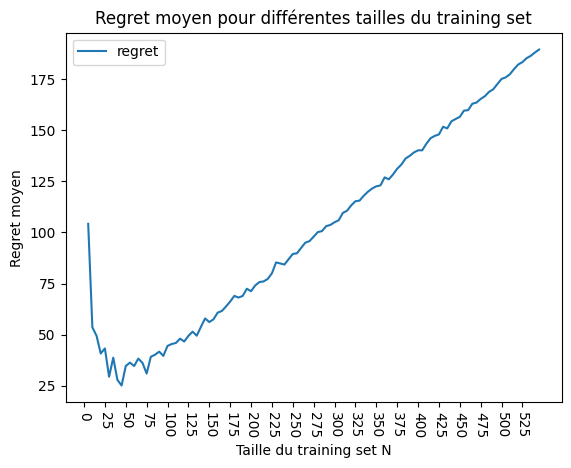

In [29]:
def exploitationQ3(n,m, mab_list):
    regrets = []
    for mab in mab_list:
        # Phase d'exploration
        R = exploration(n, mab)
        # exploitation
        hist = [n // K] * K        
        bestVac= getBestVaccin(R, hist)
        Mab_res = mab[bestVac].sample(m).sum()
        R[bestVac] += Mab_res
        hist[bestVac] += m
        ### regret
        regret = (n + m) * max([i.immunity_rate for i in mab]) - R.sum()
        regrets.append(regret)

    return regrets

m = N + M
Mab_list_regrets = []
for n in range(K,m, K):
    regrets = exploitationQ3(n, m - n, Mab_list)
    Mab_list_regrets.append(np.mean(regrets))

best_N = int(min(Mab_list_regrets))
best_M = int(m - best_N)

print(f'min: {min(Mab_list_regrets):.2f}, k: {Mab_list_regrets.index(min(Mab_list_regrets)) * 5}')
print(f'max: {max(Mab_list_regrets):.2f}, k: {Mab_list_regrets.index(max(Mab_list_regrets)) * 5}')

plt.plot(range(K,m, K), Mab_list_regrets, label='regret')
plt.xticks(np.arange(0, m, 25), rotation=-90)
plt.title("Regret moyen pour différentes tailles du training set")
plt.xlabel("Taille du training set N")
plt.ylabel("Regret moyen")
plt.legend()
plt.show()


En lançant plusieurs fois l'algorithme, on remarque que la taille optimale de l'ensemble d'entraînement se trouve entre 30 et 60. Le graphique le confirme.

Avoir une phase d'exploration trop grande va réduire l'erreur possible due à l'aléa des MAB. Cependant, utiliser trop souvent de mauvais vaccins va réduire le nombre de patients soignés et, par la même occasion, les récompenses cumulées. Cela explique l'augmentation du regret à partir de 60.

Avant 30, l'algorithme n'a pas le temps de faire assez de tests sur chaque vaccin pour éviter une erreur d'approximation du taux d'immunité. Cette erreur vient de l'aléa des MAB. Ainsi, en sortant de la phase d'exploration, il se peut que le vaccin avec les meilleurs résultats soit le pire.

**Q4. On propose d'améliorer l'algorithme précédant en mettant à jour les taux d'immunisation empiriques $\hat{\mu}_i$ pendant la phase d'exploitation (algorithme *greedy*). Concrètement, à chaque nouvel patient, on lui administre le meilleur vaccin selon les stats. Notez vous une amélioration du regret ? Proposez un exemple où les taux d'immunisation du MAB ne changent rien.** 

In [15]:
def exploitationQ4(n,m, mab_list):
    regrets = []
    for mab in mab_list:
        # Phase d'exploration
        R = exploration(n, mab)
        # exploitation
        list_immunity_rate = [i.immunity_rate.item() for i in mab]
        bestVacGt = list_immunity_rate.index(max(list_immunity_rate))
        hist = [n // K] * K

        total_rewards = R.sum()
        for _ in range(1, m + 1):  
            bestVac = getBestVaccin(R, hist)
            Mab_res = mab[bestVac].sample()
            hist[bestVac] += 1
            R[bestVac] += Mab_res
            total_rewards += Mab_res
            # Mise à jour du regret à chaque étape
        regret = (n + m) * list_immunity_rate[bestVacGt] - total_rewards
        regrets.append(regret)
    return regrets

regrets = exploitationQ4(N, M, Mab_list) 

print(f'N = {N}, M = {M} regret mean: {np.mean(regrets):.2f}, regret standard deviation: {np.std(regrets):.2f}')

N = 50, M = 500 regret mean: 20.54, regret standard deviation: 11.59


On remarque une amélioration du regret par rapport à la question 3. L'écart-type a lui aussi largement baissé. Cette baisse, due à l'algorithme *greedy*, montre que même si la phase d'exploration ne trouve pas le meilleur vaccin, l'algorithme va se rattraper pendant la phase d'exploitation en changeant la stratégie de vaccination en fonction des nouvelles statistiques.

Dans le cas où, dès la phase d'exploration, on trouve directement le meilleur vaccin théorique, cette amélioration n'aura pas d'impact.

**Q5. Nouvelle amélioration : à chaque nouveau patient, on choisit si on lui administre le meilleur vaccin avec une probabilité $\epsilon$ ou un vaccin aléatoire ($p=1-\epsilon$). Vérifiez si vous obtenez un meilleur résultat avec N = 0 ou N > 0. À votre avis, à quoi sert $\epsilon$ ?** 

In [16]:
def exploitationQ5(n,m, mab_list, epsilon):
    regrets = []
    list_regrets = []
    for mab in mab_list:
        # Phase d'exploration
        R = exploration(n, mab)
        # exploitation
        list_immunity_rate = [i.immunity_rate.item() for i in mab]
        bestVacGt = list_immunity_rate.index(max(list_immunity_rate))
        hist = [n // K] * K        

        list = [(i * list_immunity_rate[bestVacGt] - R[:i].sum() ) for i in range(1, n + 1)]
        for i in range(1, m + 1):  
            if (np.random.rand() <= epsilon):
                bestVac = getBestVaccin(R, hist)
            else:
                bestVac = np.random.randint(K)
            Mab_res = mab[bestVac].sample()
            hist[bestVac] += 1
            R[bestVac] += Mab_res
            
            list.append((n + i) * list_immunity_rate[bestVacGt] - R.sum())

        regrets.append(list[-1])
        list_regrets.append(list)

    return regrets, list_regrets

Mab_list_regrets = []


regrets_0, _ = exploitationQ5(0, M + N, Mab_list, 0.7)
regrets_N, list_regrets = exploitationQ5(N, M, Mab_list, 0.7)

print(f'N = 0, regret = {np.mean(regrets_0):.2f}')
print(f'N > 0, regret = {np.mean(regrets_N):.2f}')

N = 0, regret = 60.40
N > 0, regret = 68.10


On a choisit arbitrairement la valeur 0.7 pour *epsilon*.

*epsilon* sert à simuler une phase d'exploration avec N=1. Cela permet de tester des vaccins moins efficaces selon les stats, par moment un manque de chance sur le vaccin joue en ca défaveur, même si ce dernier à un taux d'immunité élevé.

On remarque une augmentation du regret par rapport aux questions précédentes. Cette augmentation est provoquée par l'ajout de l'amélioration. En effet, contrairement aux questions précédentes, l'algorithme utilisera potentiellement un vaccin très mauvais durant la phase d'exploitation. Là où précédemment on était plus ou moins assuré que le vaccin choisi était le meilleur ou proche du vaccin avec le plus haut taux d'immunité.

## I.b. Borne inférieure de Lai & Robbins [Lai et Robbins, 1985]

Lai et Robbins [Lai et Robbins, 1985] considère une classe d'algorithmes $\pi$ pour résoudre ce type de problèmes.

Ils ont trouvé une borne inférieure sur les récompenses cumulées en valeur asymptotique :

$$\lim_{n\rightarrow \infty} \inf_{\pi} \frac{\sum_{k=0}^{n-1} R_k}{\log n} \geq \sum_{i~\text{tel que}~\mu_i \lt \mu^*} \frac{\mu^∗−\mu_i}{\text{KL}(\mu_i, \mu^*)}  :=C(\mu)$$
 
 avec $\text{KL}(x, y) = x \log(x/y) + (1 − x) \log((1 − x)/(1 − y))$ (distance de Kullback-Leibler) et  $\sum_{k=0}^{n-1} R_k$ la récompense obtenue sur $n$ patients.
 
 
**Q6. Justifiez pourquoi on peut en déduire que le regret d'un algorithme raisonnable sera au pire logarithmique.**

on remarque que $C(\mu)$ est une constante. cela veut dire que les récompenses cumulées croît au moins proportionnelement à $\log n$

En utilisant la borne inférieur sur la formule du regret $R(n) = n \mu^* - \sum_{k=0}^{n-1} R_k$ vu en cours on obtient :
$$R(n) \leq n \mu^* - C(\mu)\log n$$

le regret est donc majoré par une expression linéaire $n - \log n$



**Q7. Tracez le regret issu de la borne de Lai & Robbins et comparez le au regret obtenu avec l'algorithme glouton.**

In [17]:
# nouvelle exploration qui stocke les regrets
def explorationQ7(n, mab):
    R = np.zeros(K)
    regrets = []
    bv = np.max([i.immunity_rate for i in mab])
    for i in range(n // K):
        for j, arm in enumerate(mab):
            R[j] += arm.sample()
            regrets.append((K * i + (j + 1)) * bv - R.sum())
    return R, regrets

# exploitation de la Q4 (sans epsilon)
def exploitationQ7(n,m, mab_list):
    MABS_regrets = []
    for mab in mab_list:
        MAB_regrets = []
        # Phase d'exploration
        R, exploration_regrets = explorationQ7(n, mab)
        MAB_regrets.extend(exploration_regrets)
        # exploitation
        bestVacGt = np.max([i.immunity_rate for i in mab])
        hist = [n // K] * K

        for i in range(1, m + 1):  
            bestVac = getBestVaccin(R, hist)
            R[bestVac] += mab[bestVac].sample()
            hist[bestVac] += 1
            # Mise à jour du regret à chaque étape
            regret = (n + i) * bestVacGt - R.sum()
            MAB_regrets.append(regret)
        MABS_regrets.append(MAB_regrets)
    return MABS_regrets

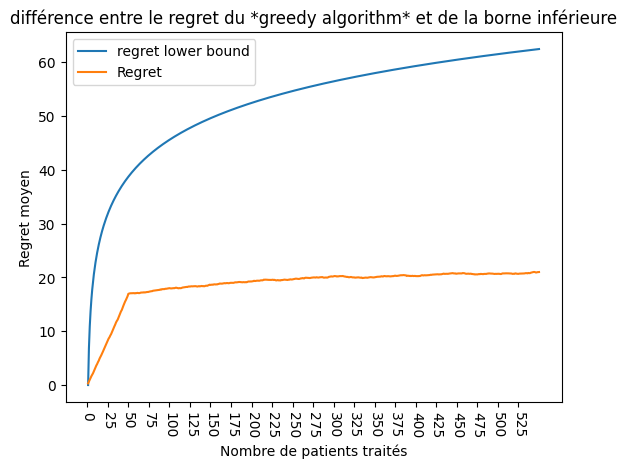

In [18]:
def kl(x,y):
    return x * np.log(x/y) + (1-x) * np.log((1-x)/(1-y))

def lower_bound(n, mab):
    bestVacGt = max([mu.immunity_rate.item() for mu in mab])
    C = 0
    for mu in mab:
        if mu.immunity_rate.item() == bestVacGt:
            continue
        C += (bestVacGt - mu.immunity_rate.item())  / kl(mu.immunity_rate.item(), bestVacGt) 
    return C * np.log(n)

list_c = []
for mab in Mab_list:
    c = []
    for i in range(1, N + M+1):
        c.append(lower_bound(i, mab))
    list_c.append(c)


regrets = exploitationQ7(N, M, Mab_list)

plt.plot(range(1, N + M+1), np.mean(list_c, axis=0), label='regret lower bound')
plt.plot(range(1, N + M+1), np.mean(regrets, axis=0), label='Regret')
plt.xticks(np.arange(0, N+M, 25), rotation=-90)
plt.title("différence entre le regret du *greedy algorithm* et de la borne inférieure")
plt.xlabel("Nombre de patients traités")
plt.ylabel("Regret moyen")
plt.legend()
plt.show()

La courbe de regret reste bien en dessous de la courbe de regret de la borne inférieure. Cela confirme la réponse de la question 6. Les 50 premiers regrets correspondent à la phase d'exploration, cela explique sa forme différente.

## I.c. Upper Confidence Bounds

Cet algorithme améliore la version précédente en ajoutant un biais lié à la fréquentation de chaque vaccin :

$\bar{\mu}_i = \hat{\mu}_i + \sqrt{\frac{C\log{n}}{T_i}}$,

avec $C=2$.



**Q8. Implémentez la modification de cet algorithme. Observez un intérêt à conserver $N > 0$ ? Et $\epsilon < 1$ ? Expliquez pourquoi.**

Dans la suite, on prendra $N = 0$ et $\epsilon = 1$.

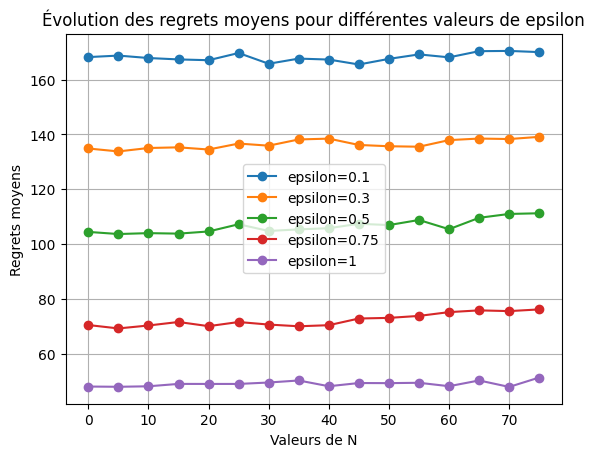

In [19]:
def getBestVaccinWithBiais(R, hist,nb, C=2):
    Ri = np.zeros(K)
    for i in range(K):
        if hist[i] != 0:
            Ri[i] = R[i] / hist[i] + math.sqrt(C * math.log(nb) / hist[i])
        else:
            Ri[i] = np.inf
    return Ri.argmax()

def exploitationQ8(n,m, mab_list, epsilon):
    regrets = []
    for mab in mab_list:
        # Phase d'exploration
        R = exploration(n, mab)
        # exploitation
        list_immunity_rate = [i.immunity_rate.item() for i in mab]
        bestVacGt = list_immunity_rate.index(max(list_immunity_rate))
        hist = [n // K] * K
        
        total_rewards = R.sum()
        for i in range(1, m + 1):  
            if (np.random.rand() <= epsilon):
                bestVac = getBestVaccinWithBiais(R, hist, n+i)
            else:
                bestVac = np.random.randint(K)
            Mab_res = mab[bestVac].sample()
            hist[bestVac] += 1
            R[bestVac] += Mab_res
            total_rewards += Mab_res
            # Mise à jour du regret à chaque étape
        regret = (n + i) * list_immunity_rate[bestVacGt] - total_rewards
        regrets.append(regret)

    return regrets

Mab_list_regrets = []

# Initialisation des listes pour chaque epsilon
m = N + M
borneN = [0,80]
epsilons = [0.1, 0.3, 0.5, 0.75, 1]
n_values = range(borneN[0], borneN[1], K)  # borneN et K doivent être définis
Mab_list_regrets = {epsilon: [] for epsilon in epsilons}  # Dictionnaire pour chaque epsilon

for n in n_values:
    for epsilon in epsilons:
        regrets = exploitationQ8(n, m - n, Mab_list, epsilon)
        Mab_list_regrets[epsilon].append(np.mean(regrets))

# Tracer les résultats
for epsilon in epsilons:
    plt.plot(n_values, Mab_list_regrets[epsilon], marker='o', linestyle='-', label=f'epsilon={epsilon}')

plt.title('Évolution des regrets moyens pour différentes valeurs de epsilon')
plt.xlabel('Valeurs de N')
plt.ylabel('Regrets moyens')
plt.legend()  # Ajoute une légende pour chaque courbe
plt.grid(True)
plt.show()

$N > 0$ indique qu'il y aura une phase d'exploration avant la phase d'exploitation. Ainsi, avant d'exploiter les vaccins, on aura des statistiques plus ou moins bonnes sur le taux d'immunité. Or, la formule avec le biais de UCB force l'algorithme à tester des vaccins dont on n'a pas d'information. Sur un nombre de patients assez élevé, le biais rend la phase d'exploration inutile car chaque vaccin sera forcément testé.

$\epsilon < 1$ indique que pendant la phase d'exploitation, il y a une chance qu'on choisisse aléatoirement un vaccin, ce qui permet de rectifier une possible erreur due à un manque de chance dans la phase d'exploration. Or, comme expliqué plus haut, le biais s'assure que l'algorithme n'utilise pas tout le temps le même vaccin (pour un grand nombre de patients testés).

Le biais ajouté remplace donc ces deux paramètres, les rendant inutiles.

**Q9. Tracez sous la forme d'une animation l'évolution du regret et l'évolution des taux d'immunisation empirique. Dans la figure de gauche, vous representerez $\bar{\mu}_i$ et $\hat{\mu}_i$.**

In [22]:
def compute_erc(R, hist):
    Ri = np.array([np.inf] * K) # usefull when n = 0
    for i in range(K):
        if hist[i] != 0:
            Ri[i] = R[i] / hist[i]
    return Ri

def compute_er_(R, hist, nb, C=2):
    Ri = np.array([np.inf] * K) # usefull when n = 0
    for i in range(K):
        if hist[i] != 0:
            Ri[i] = R[i] / hist[i] + math.sqrt(C * math.log(nb) / hist[i])
    return Ri

def exploitationQ9(m, mab_list, C=2):
    regrets = []
    mu_ = []
    muc = []
    for mab in mab_list:
        regret_list = []
        rate_list = []
        rate_list_ = []
        # Phase d'exploration
        R = np.zeros(K)
        # Phase exploitation
        bestVacGt = max([i.immunity_rate.item() for i in mab])
        hist = np.zeros(K)

        for i in range(1, m + 1):
            bestVac = np.argmax(compute_er_(R, hist, i - 1, C))
            # Mise à jour des résultats et de l'histogramme
            R[bestVac] += mab[bestVac].sample()
            hist[bestVac] += 1

            # Mise à jour du regret à chaque étape
            regret = (i) * bestVacGt - R.sum()
            regret_list.append(regret)

            # calcul de mû
            erc = compute_erc(R, hist)
            rate_list.append(erc)

            # calcul de mu_
            er_ = compute_er_(R, hist,i, C)
            rate_list_.append(er_)
        
        regrets.append(regret_list)
        muc.append(rate_list)
        mu_.append(rate_list_)
    return regrets, muc, mu_

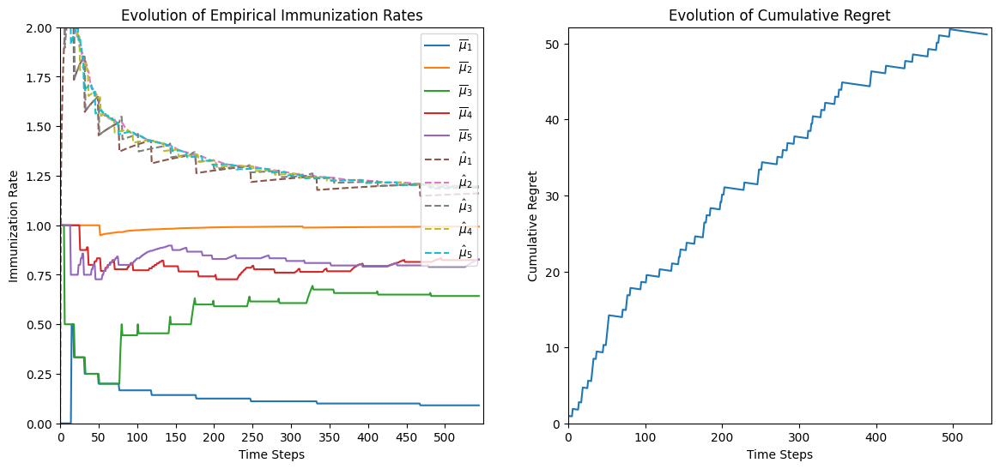

In [23]:
Mab_list_1 = [generate_arms(K) for _ in range(1)]
Mab_list_regrets = []
M = 550

# Run the exploitation function
regrets, muc, mu_ = exploitationQ9(M, Mab_list_1)

# Mean cumulative regret over simulations
mean_regret = np.mean(regrets, axis=0)  # Shape: (M,)

# Mean muc and mu_ over simulations
mean_muc = np.mean(muc, axis=0)  # Shape: (M, K)
mean_mu_ = np.mean(mu_, axis=0)  # Shape: (M, K)

# Set up the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Initialize lines for the left plot
lines_muc = [ax1.plot([], [], label=f'$\overline{{\mu}}_{i+1}$')[0] for i in range(K)]
lines_mu_ = [ax1.plot([], [], linestyle='--', label=f'$\hat{{\mu}}_{i+1}$')[0] for i in range(K)]

# Initialize line for the right plot
line_regret, = ax2.plot([], [], label='Cumulative Regret')

# Set up the axes
ax1.set_xlim(0, M)
ax1.set_ylim(0, 2)
ax1.set_xlabel('Time Steps')
ax1.set_ylabel('Immunization Rate')
ax1.set_title('Evolution of Empirical Immunization Rates')
ax1.legend(loc='upper right')
ax1.set_xticks(np.arange(0, M, 50))

ax2.set_xlim(0, M)
ax2.set_ylim(0, np.max(mean_regret))
ax2.set_xlabel('Time Steps')
ax2.set_ylabel('Cumulative Regret')
ax2.set_title('Evolution of Cumulative Regret')

frames = np.arange(0, M, 5)

# Animation function
def animate(i):
    x = np.arange(i)
    
    # Update left plot with $\bar{\mu}_i$ and $\hat{\mu}_i$
    for k in range(K):
        # Update empirical mean immunization rate lines
        y_muc = mean_muc[:i, k]
        lines_muc[k].set_data(x, y_muc)
        
        # Update upper confidence bound lines
        y_mu_ = mean_mu_[:i, k]
        lines_mu_[k].set_data(x, y_mu_)
    
    # Update right plot with cumulative regret
    y_regret = mean_regret[:i]
    line_regret.set_data(x, y_regret)

    return lines_muc + lines_mu_ + [line_regret]

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=frames, interval=50, blit=True, cache_frame_data=False)
HTML(ani.to_jshtml())



On remarque que les courbes des taux empiriques $\bar{\mu}_i$ se chevauchent, là où celles de $\hat{\mu}$ sont clairement distinctes. Cette différence, liée au biais de UCB, montre bien les spécificités de chaque algorithme.

**Q10. Reprenez la question Q5 avec cette algorithme. Concluez sur l'utilité (ou l'inutilité) de la phase d'exploration. Comparez les performances d'UCB avec celles de l'algorithme glouton.**

In [24]:
def exploitationQ10(n,m, mab_list, C=2):
    regrets = []
    for mab in mab_list:
        # Phase exploitation
        list_immunity_rate = [i.immunity_rate.item() for i in mab]
        bestVacGt = list_immunity_rate.index(max(list_immunity_rate))
        hist = np.zeros(K)
        R = np.zeros(K)
        for i in range(1, m + 1):
            bestVac = compute_er_(R, hist, n+i - 1, C).argmax()
        
            # Mise à jour des résultats et de l'histogramme
            Mab_res = mab[bestVac].sample()
            hist[bestVac] += 1
            R[bestVac] += Mab_res

        regret = (n + m) * list_immunity_rate[bestVacGt] - R.sum()
        
        regrets.append(regret)
    return regrets

Mab_list = [generate_arms(K) for _ in range(100)]
Mab_list_regrets = []

N = 50
M = 500
epsilon = 1
regrets_0 = exploitationQ10(0,N + M, Mab_list)
regrets_N = exploitationQ10(N, M, Mab_list)
print("UCB:")
print(f'N = 0, regret = {np.mean(regrets_0):.2f}, std = {np.std(regrets_0):.2f}, min = {min(regrets_0):.2f}, max = {max(regrets_0):.2f}')
print(f'N > 0, regret = {np.mean(regrets_N):.2f}, std = {np.std(regrets_N):.2f}, min = {min(regrets_N):.2f}, max = {max(regrets_N):.2f}')

regrets_0, _ = exploitationQ5(0, M + N, Mab_list, 0.7)
regrets_N, list_regrets = exploitationQ5(N, M, Mab_list, 0.7)
print("glouton:")
print(f'N = 0, regret = {np.mean(regrets_0):.2f}, std = {np.std(regrets_0):.2f}, min = {min(regrets_0):.2f}, max = {max(regrets_0):.2f}')
print(f'N > 0, regret = {np.mean(regrets_N):.2f}, std = {np.std(regrets_N):.2f}, min = {min(regrets_N):.2f}, max = {max(regrets_N):.2f}')

UCB:
N = 0, regret = 50.57, std = 11.33, min = 21.10, max = 75.09
N > 0, regret = 90.94, std = 12.94, min = 51.53, max = 121.31
glouton:
N = 0, regret = 62.33, std = 22.20, min = 9.48, max = 143.89
N > 0, regret = 71.00, std = 25.02, min = 12.74, max = 149.19


On obtient un meilleur regret sans phase d'exploration, ce qui prouve qu'elle est obsolète lorsqu'on utilise l'algorithme UCB.

Les performances de l'algorithme UCB sont meilleures que celles de l'algorithme glouton quand il n'y a pas de phase d'exploration.

**Q11. Testez différentes valeurs pour $C$ et trouvez sa valeur optimale expérimentalement.**

c optimal: 0.05


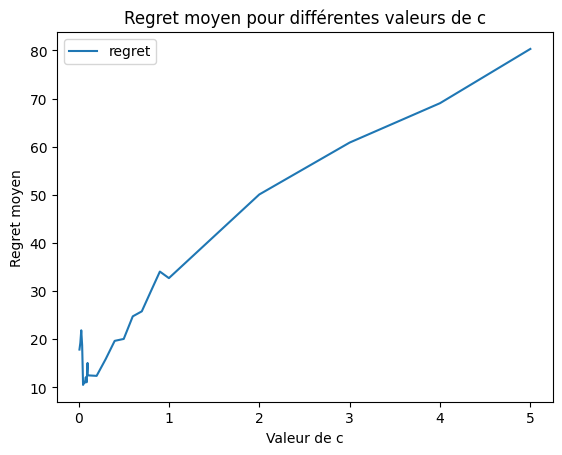

In [32]:
def exploitationQ11(m, mab_list, C=2):
    regrets = []
    for mab in mab_list:
        # Phase exploitation
        list_immunity_rate = [i.immunity_rate.item() for i in mab]
        bestVacGt = list_immunity_rate.index(max(list_immunity_rate))
        hist = np.zeros(K)
        R = np.zeros(K)
        for i in range(1, m + 1):
            bestVac = compute_er_(R, hist, i - 1, C).argmax()
        
            # Mise à jour des résultats et de l'histogramme
            Mab_res = mab[bestVac].sample()
            hist[bestVac] += 1
            R[bestVac] += Mab_res

        regret = m * list_immunity_rate[bestVacGt] - R.sum()
        
        regrets.append(regret)
    return regrets

Mab_list_regrets = []
list_regrets = []
r = [i/100 for i in range(1, 11)]
r.extend([i/10 for i in range(1, 11)])
r.extend([i for i in range(2, 6)])
for c in r:
    regret = np.mean(exploitationQ11(M, Mab_list, c))
    list_regrets.append(regret)

print(f'c optimal: {r[list_regrets.index(min(list_regrets))]}')

plt.plot(r, list_regrets, label='regret')
plt.title("Regret moyen pour différentes valeurs de c")
plt.xlabel("Valeur de c")
plt.ylabel("Regret moyen")
plt.legend()
plt.show()

Après plusieurs test le c optimal se trouve aux alentours de 0.1. En réduisant le c on réduit par la même occasion le poid du biais sur la formule. Si le biais est trop fort il ajoute un bruit non négligeable sur le regret.

# Echantillonnage de Thomson

Cet algorithme propose de modéliser la variable aléatoire de chaque vaccin avec une loi $\beta$ dont les paramètres $a$ et $b$ correspondent au nombre de patients que le vaccin a immunisés (resp. non immunisés).

Pour chaque patient, on tire un valeur aléatoire pour la loi $\beta$ décrivant chaque vaccin, puis on choisit le vaccin avec la plus grande valeur tirée. 

**Q12. Implémentez cet algorithme. Conservez les deux phases exploration/exploitation décrites ci-dessus. En prenant les valeurs de $N$ et $M$ trouvées à la question Q5, quel regret obtenez-vous ? Faites l'expérience avec au moins 10 MAB différents (tous ayant 5 vaccins) afin de calculer la moyenne et l'écart-type du regret.**

In [30]:
def thompson_sampling(n, m, mab_list):
    regrets = []
    
    for mab in mab_list:  # Ajout de la boucle pour chaque MAB
        num_arms = len(mab)
        
        # Initialisation des paramètres a et b
        a = np.ones(num_arms)
        b = np.ones(num_arms)
        
        total_rewards = 0
        best_vaccine = best_vaccine_in_mab(mab)  # Le vrai meilleur vaccin
        
        # Phase d'exploration
        for i in range(n):
            vaccine_chosen = np.random.randint(num_arms)
            reward = mab[vaccine_chosen].sample().sum()  # Supposons que sample renvoie une somme
            total_rewards += reward
            if reward == 1:
                a[vaccine_chosen] += 1
            else:
                b[vaccine_chosen] += 1
        
        # Phase d'exploitation
        for i in range(m):
            sampled_values = [np.random.beta(a[j], b[j]) for j in range(num_arms)]
            vaccine_chosen = np.argmax(sampled_values)
            reward = mab[vaccine_chosen].sample().sum()
            total_rewards += reward
            if reward == 1:
                a[vaccine_chosen] += 1
            else:
                b[vaccine_chosen] += 1
        
        optimal_reward = (n + m) * mab[best_vaccine].immunity_rate
        regret = optimal_reward - total_rewards
        regrets.append(regret)
    
    return regrets, a, b

# Test de la fonction thompson_sampling
Mab_list_10 = Mab_list[:10]
regrets, a, b = thompson_sampling(best_N, best_M, Mab_list_10)

print(f"Regret moyen : {np.mean(regrets):.2f}")
print(f"Écart-type du regret : {np.std(regrets):.2f}")


Regret moyen : 18.28
Écart-type du regret : 9.18


Le regret moyen a légèrement diminué par rapport à l'algorithme UCB, on remarque cependant une diminution significative de l'écart type. On en conclue que l'échantillonage de Thomson arrive à trouver le vaccin le plus efficace plus rapidement et avec plus de confiance.

**Q13. Reprenez la question Q4, mais cette fois-ci, vous representerez le taux d'immunisation empirique avec un [graphique en violon](https://en.wikipedia.org/wiki/Violin_plot) qui représente la loi beta associée à chaque vaccin.**

/Users/gaspardsaliou/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/gaspardsaliou/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/gaspardsaliou/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Users/gaspardsaliou/Library/Python/3.11/lib/python/site-pa

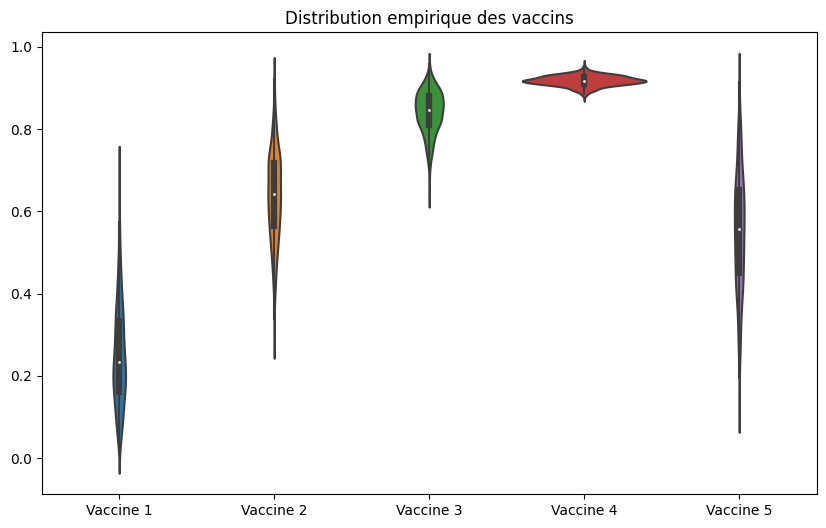

In [35]:
data = []
labels = []
for i in range(len(a)):
    beta_distribution = Beta(a[i], b[i]).sample((1000,))
    data.append(beta_distribution.numpy())
    labels.append(f'Vaccine {i+1}')
    
plt.figure(figsize=(10, 6))
sns.violinplot(data=data)
plt.xticks(range(len(a)), labels)
plt.title('Distribution empirique des vaccins')
plt.show() 


- **Vaccin 1** : Ce vaccin présente une distribution très étroite et centrée vers une faible valeur (autour de 0.2), ce qui suggère une faible efficacité avec une faible variabilité dans les résultats. Cela signifie que ce vaccin n’est pas performant et qu'il a des chances réduites d'immunisation.
  
- **Vaccin 2** : La distribution est plus large, centrée autour de 0.5. Cela montre une variabilité relativement importante dans ses performances, avec des chances modérées d'immunisation, mais une incertitude plus grande par rapport à l’efficacité.

- **Vaccin 3** : Ce vaccin présente une distribution plus concentrée et centrée autour de 0.8, suggérant une haute efficacité avec peu de variabilité. Ce vaccin est probablement l’un des plus performants en termes de probabilité d’immunisation.

- **Vaccin 4** : La distribution du Vaccin 4 est assez distincte, très concentrée autour d'une probabilité d’environ 0.9, ce qui en fait le vaccin avec la meilleure probabilité d'immunisation observée. Sa forme aplatie indique également une grande fiabilité avec une très faible variabilité dans les résultats.

- **Vaccin 5** : La distribution de ce vaccin est plus étalée, avec une probabilité médiane autour de 0.5, mais avec des queues plus longues, indiquant une grande incertitude dans les résultats. Cela reflète une efficacité plus modérée et incertaine par rapport à certains autres vaccins.


En résumé,le **Vaccin 4** semble être le plus efficace avec la probabilité d'immunisation la plus élevée et la plus faible variabilité, ce qui en fait le meilleur candidat. Le **Vaccin 3** est également performant, avec une probabilité d'immunisation élevée mais légèrement inférieure à celle du Vaccin 4. Les autres vaccins présentent soit des performances plus faibles (Vaccins 1 et 2), soit une plus grande incertitude (Vaccin 5).

**Q14. Représentez son regret pour différentes tailles du training set (comme dans la Q5). Comparez le regret avec les autres algorithmes.**

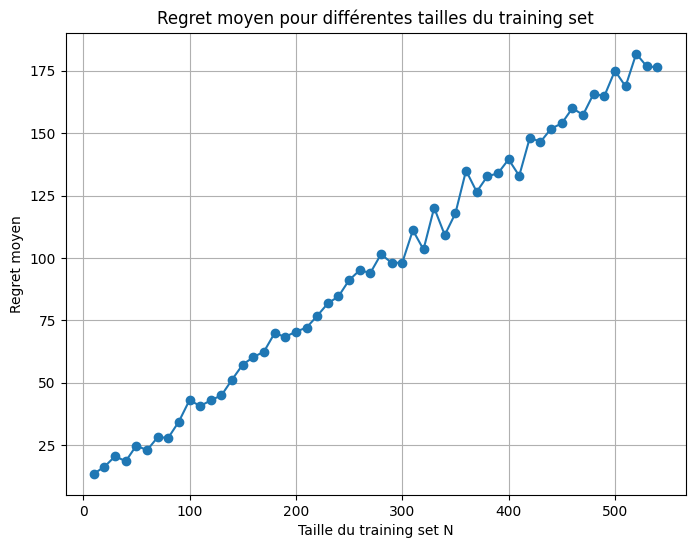

In [31]:
def thompson_varying_n(m, mab_list):
    n_values = range(10, m, 10)
    regrets = []
    for n in n_values:
        regret_values, a, b = thompson_sampling(n, m - n, mab_list)
        regrets.append(np.mean(regret_values))
    return n_values, regrets


M = 550
n_values, regrets = thompson_varying_n(M, Mab_list_10)

# Tracer le regret
plt.figure(figsize=(8, 6))
plt.plot(n_values, regrets, marker='o')
plt.title("Regret moyen pour différentes tailles du training set")
plt.xlabel("Taille du training set N")
plt.ylabel("Regret moyen")
plt.grid(True)
plt.show()


Thompson Sampling montre une augmentation progressive du regret avec 𝑁. Cela signifie que, bien qu'il soit performant au début, il a du mal à converger rapidement lorsqu'il y a plus de données disponibles. Son approche basée sur la distribution de probabilité l'oblige à équilibrer l'exploration et l'exploitation, ce qui peut prendre du temps dans des environnements avec beaucoup de vaccins ou de données à explorer.

UCB est potentiellement le meilleur algorithme en termes de regret sur de grandes tailles de 𝑁. Thompson Sampling est meilleur au début, mais son regret augmente rapidement. Greedy est très performant pour des petites tailles, mais souffre à mesure que 𝑁 augmente.

# Conclusion

**Q15. Calculez le regret des algorithmes glouton, UCB & Thomson lorsqu'il y a un grand nombre de vaccins disponibles (K=100) (on prendra N=100). Faites le lien avec la [malédiction de la dimension](https://fr.wikipedia.org/wiki/Fl%C3%A9au_de_la_dimension).**

In [80]:
K = 100
N = 100
M = 500
num_trials = 5

Mab_list = [generate_arms(K) for _ in range(num_trials)]
    
regrets_greedy = exploitationQ2(N, M, Mab_list)
regrets_ucb = exploitationQ8(N, M, Mab_list, 1)
regrets_thompson, a, b = thompson_sampling(N, M, Mab_list)

print(f"Regret moyen (Greedy) : {np.mean(regrets_greedy):.2f}")
print(f"Regret moyen (UCB) : {np.mean(regrets_ucb):.2f}")
print(f"Regret moyen (Thompson) : {np.mean(regrets_thompson):.2f}")

Regret moyen (Greedy) : 137.30
Regret moyen (UCB) : 224.00
Regret moyen (Thompson) : 110.60


Nous observons que Thompson Sampling a le regret moyen le plus faible, suivi par Greedy, et enfin UCB. Cela souligne que Thompson Sampling gère mieux les situations avec un grand nombre de dimensions, grâce à sa stratégie probabiliste qui équilibre exploration et exploitation de manière plus fluide.

La "malédiction de la dimension" se manifeste ici par le fait qu'à mesure que le nombre de vaccins augmente, l'algorithme doit explorer un espace de décision plus vaste, ce qui augmente le regret, surtout pour les algorithmes qui misent sur une exploration plus agressive comme UCB. Thompson Sampling parvient cependant à limiter cet effet en ajustant ses décisions en fonction de la probabilité de succès des différentes actions.